## Raster Data

In scikit-map, the class `RasterData` is responsible to implement reading, processing and writing operations. To understand how it works let's load the NDVI toy dataset provided by default.

In [1]:
import warnings

warnings.filterwarnings("ignore")

from skmap.data import toy

rdata = toy.ndvi_rdata(gappy=True)

[08:17:34] RasterData with 24 rasters (band: 1) and 1 group(s)
[08:17:34] Reading 24 raster file(s) using 4 workers
[08:17:35] Read array shape: (256, 256, 24)


A `RasterData` instance is basically a Pandas [DataFrame](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html) accessible through the `info` attribute

In [2]:
rdata.info

,group,input_path,input_band,start_date,end_date,temporal,name
0,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2014-12-02,2015-03-20,True,ndvi_landsat.ard1_p50_30m_s_20141202_20150320_...
1,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2015-03-21,2015-06-24,True,ndvi_landsat.ard1_p50_30m_s_20150321_20150624_...
2,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2015-06-25,2015-09-12,True,ndvi_landsat.ard1_p50_30m_s_20150625_20150912_...
3,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2015-09-13,2015-12-01,True,ndvi_landsat.ard1_p50_30m_s_20150913_20151201_...
4,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2015-12-02,2016-03-20,True,ndvi_landsat.ard1_p50_30m_s_20151202_20160320_...
5,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2016-03-21,2016-06-24,True,ndvi_landsat.ard1_p50_30m_s_20160321_20160624_...
6,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2016-06-25,2016-09-12,True,ndvi_landsat.ard1_p50_30m_s_20160625_20160912_...
7,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2016-09-13,2016-12-01,True,ndvi_landsat.ard1_p50_30m_s_20160913_20161201_...
8,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2016-12-02,2017-03-20,True,ndvi_landsat.ard1_p50_30m_s_20161202_20170320_...
9,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2017-03-21,2017-06-24,True,ndvi_landsat.ard1_p50_30m_s_20170321_20170624_...


...and a 3D [Nunmpy array](https://numpy.org/doc/stable/reference/generated/numpy.array.html), the `array` attribute with `x`, `y` and `time` as dimensions.

In [3]:
rdata.array.shape

(256, 256, 24)

The `array` can be filtered and subset using `info`. 

In [4]:
rdata.array[:, :, (rdata.info["end_date"] >= "2020-01-01")].shape

(256, 256, 4)

However you can use the `filter` method passing a [query expression](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.query.html) as parameter.

In [5]:
rdata.filter('start_date > "2020-01-01"', return_array=True).shape

(256, 256, 3)

The data can be visualized through a static plot

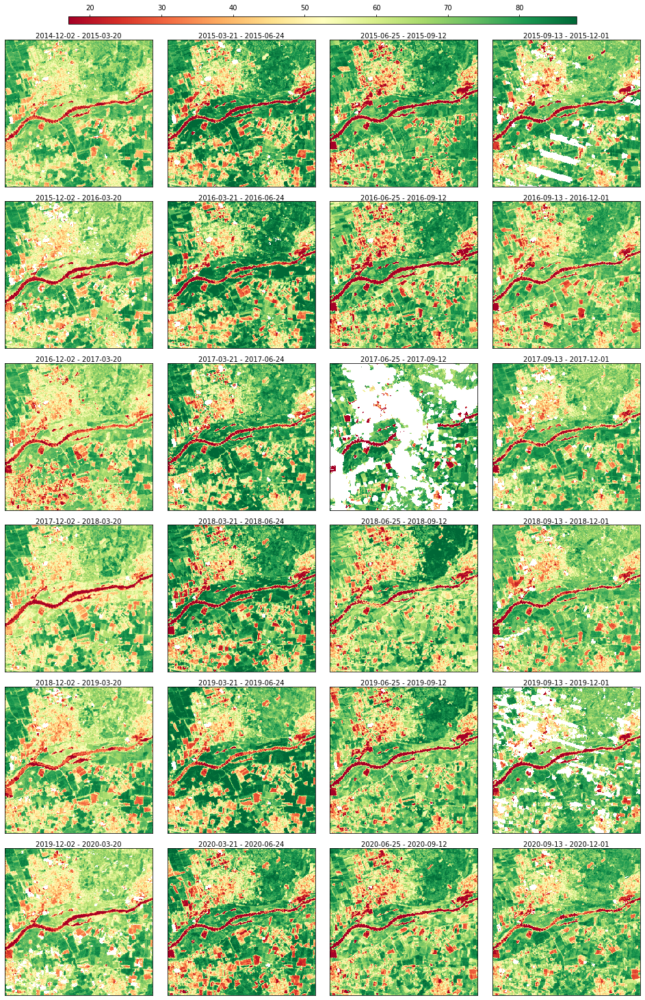

In [6]:
rdata.plot(cmap="RdYlGn", img_title_text="date")

... and an animation.

In [ ]:
rdata.animate(cmap="RdYlGn", img_title_text="date")

After visualizing the data, it's possible to notice some data gaps in the NDVI series. 

`Scikit-map` supports several data processing task including **gapfilling, smoothing, time aggregation, math operations, trend analysis, etc**.  Let's run a gapfilling process and visualize the result.

In [9]:
from skmap.io import process

rdata = rdata.run(process.SeasConvFill(season_size=4), drop_input=True)
rdata.animate(cmap="RdYlGn", img_title_text="date")

[08:18:06] Running SeasConvFill on (256, 256, 24) for ndvi.seasconv group
[08:18:06] Dropping data and info for ndvi.seasconv group
[08:18:06] Execution time for SeasConvFill: 0.48 segs


The `info` attribute shows that the new group `ndvi.seasconv` was created, and the old one `ndvi` was deleted according to `drop_input=True`.

In [10]:
rdata.info

,group,input_path,input_band,start_date,end_date,temporal,name
0,ndvi.seasconv.seasconv,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2014-12-02,2015-03-20,True,skmap_seasconv_ndvi.seasconv_20141202_20150320
1,ndvi.seasconv.seasconv,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2015-03-21,2015-06-24,True,skmap_seasconv_ndvi.seasconv_20150321_20150624
2,ndvi.seasconv.seasconv,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2015-06-25,2015-09-12,True,skmap_seasconv_ndvi.seasconv_20150625_20150912
3,ndvi.seasconv.seasconv,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2015-09-13,2015-12-01,True,skmap_seasconv_ndvi.seasconv_20150913_20151201
4,ndvi.seasconv.seasconv,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2015-12-02,2016-03-20,True,skmap_seasconv_ndvi.seasconv_20151202_20160320
5,ndvi.seasconv.seasconv,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2016-03-21,2016-06-24,True,skmap_seasconv_ndvi.seasconv_20160321_20160624
6,ndvi.seasconv.seasconv,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2016-06-25,2016-09-12,True,skmap_seasconv_ndvi.seasconv_20160625_20160912
7,ndvi.seasconv.seasconv,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2016-09-13,2016-12-01,True,skmap_seasconv_ndvi.seasconv_20160913_20161201
8,ndvi.seasconv.seasconv,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2016-12-02,2017-03-20,True,skmap_seasconv_ndvi.seasconv_20161202_20170320
9,ndvi.seasconv.seasconv,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2017-03-21,2017-06-24,True,skmap_seasconv_ndvi.seasconv_20170321_20170624


`RasterData` supports the execution of multiple processing tasks through [fluent interface](https://en.wikipedia.org/wiki/Fluent_interface) relying extensively on method chaining.

Let's testing it by
1. **Loading** again the gappy NDVI time-series, 
2. Running the **gapfilling** approach, and 
3. **aggregating** the gapffiled data by year using two time reducers operations (standard deviation and percentile 50th).

In [11]:
rdata = (
    toy.ndvi_rdata(
        gappy=True
        # Gapfilling time-series by seasonal convolution
    )
    .run(
        process.SeasConvFill(season_size=4),
        drop_input=True,
        # Renaming back the output to ndvi
    )
    .rename(
        groups={"ndvi.seasconv": "ndvi"}
        # Running yearly aggregation by std. and percentile 50th
    )
    .run(
        process.TimeAggregate(
            time=[process.TimeEnum.YEARLY], operations=["p50", "std"]
        ),
        group=["ndvi"],
    )
)

rdata.info

[08:18:13] RasterData with 24 rasters (band: 1) and 1 group(s)
[08:18:13] Reading 24 raster file(s) using 4 workers
[08:18:14] Read array shape: (256, 256, 24)
[08:18:14] Running SeasConvFill on (256, 256, 24) for ndvi group
[08:18:14] Dropping data and info for ndvi group
[08:18:14] Execution time for SeasConvFill: 0.61 segs
[08:18:14] Running TimeAggregate on (256, 256, 24) for ndvi group
[08:18:15] Execution time for TimeAggregate: 0.19 segs


,group,input_path,input_band,start_date,end_date,temporal,name
0,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2014-12-02,2015-03-20,True,skmap_seasconv_ndvi_20141202_20150320
1,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2015-03-21,2015-06-24,True,skmap_seasconv_ndvi_20150321_20150624
2,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2015-06-25,2015-09-12,True,skmap_seasconv_ndvi_20150625_20150912
3,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2015-09-13,2015-12-01,True,skmap_seasconv_ndvi_20150913_20151201
4,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2015-12-02,2016-03-20,True,skmap_seasconv_ndvi_20151202_20160320
5,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2016-03-21,2016-06-24,True,skmap_seasconv_ndvi_20160321_20160624
6,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2016-06-25,2016-09-12,True,skmap_seasconv_ndvi_20160625_20160912
7,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2016-09-13,2016-12-01,True,skmap_seasconv_ndvi_20160913_20161201
8,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2016-12-02,2017-03-20,True,skmap_seasconv_ndvi_20161202_20170320
9,ndvi,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,2017-03-21,2017-06-24,True,skmap_seasconv_ndvi_20170321_20170624


Let's visualize the result of the annual aggregation (percentile 50th):

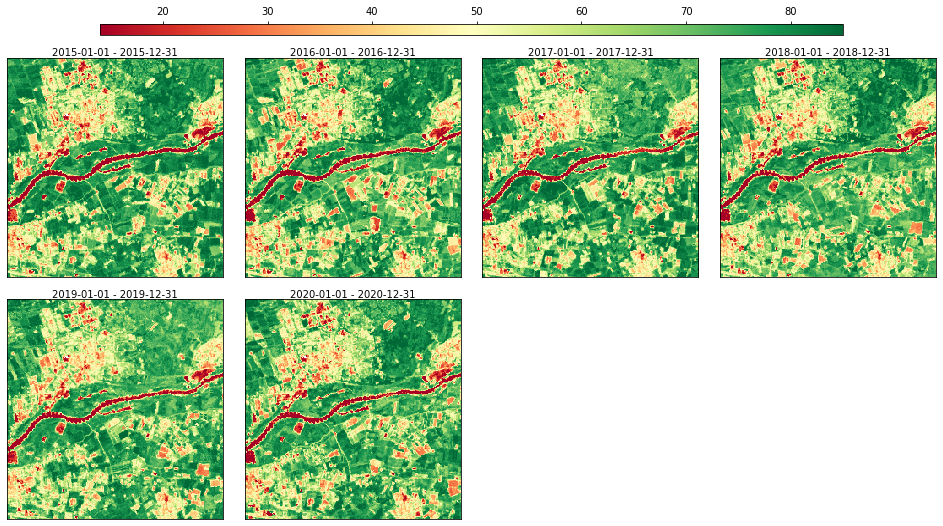

In [12]:
rdata.plot(groups=["ndvi.yearly.p50"], cmap="RdYlGn", img_title_text="date")

### Layer groups

RasterData supports different set of layer, organizing them by groups. **Multiple bands** of a raster time-series, a for example NDVI and SWIR-1 band, can be organized different groups. However it's also possible to have **different time-series** size in each group, and even **static raster layers** without a specific date interval.

To demonstrate that let's load another toy dataset which provides multi group support.

[08:18:18] RasterData with 50 rasters (band: 1) and 3 group(s)
[08:18:18] Reading 50 raster file(s) using 4 workers
[08:18:18] Read array shape: (256, 256, 50)


<Axes: ylabel='group'>

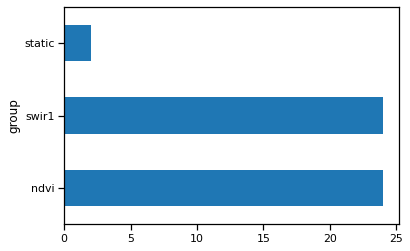

In [13]:
import seaborn as sns

from skmap.data import toy

sns.set_context("notebook")

rdata = toy.rdata()
rdata.info["group"].value_counts().plot(kind="barh")

How the `static` group looks like?

In [14]:
rdata.filter("group == 'static'").info

,group,input_path,input_band,start_date,end_date,temporal,name
24,static,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,None,None,False,elev.lowestmode_gedi.eml_mf_30m_s_20000101_201...
25,static,/home/opengeohub/src/scikit-map/skmap/data/toy...,1,None,None,False,slope.percent_gedi.eml_m_30m_s_20000101_201812...


In a multi group `RasterData`, most of the processing tasks are executed for each group separately. 

To demonstrate it, let's run the annual aggregation by percentile 95th.

In [15]:
from skmap.io import process

rdata = rdata.run(
    process.TimeAggregate(time=[process.TimeEnum.YEARLY], operations=["p95"])
)

[08:18:23] Running TimeAggregate on (256, 256, 24) for ndvi group
[08:18:23] Execution time for TimeAggregate: 0.08 segs
[08:18:23] Skipping TimeAggregate for static group
[08:18:23] Running TimeAggregate on (256, 256, 24) for swir1 group
[08:18:23] Execution time for TimeAggregate: 0.07 segs


And you can see two more groups in `rdata`.

<Axes: ylabel='group'>

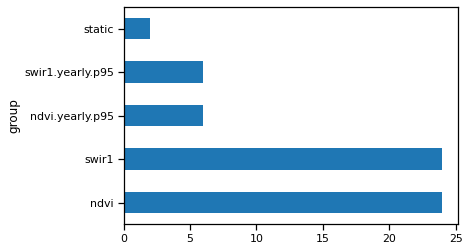

In [16]:
rdata.info["group"].value_counts().plot(kind="barh")

Let's visualize one of them.

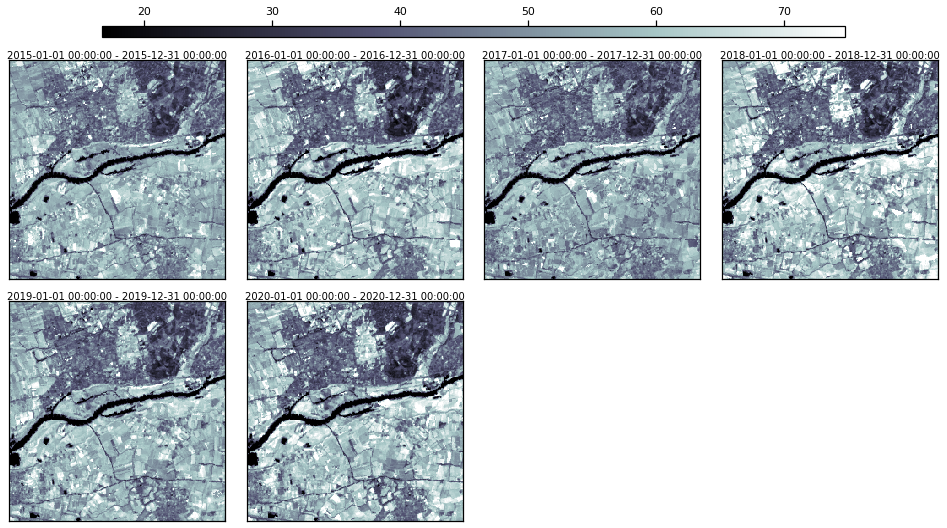

In [17]:
rdata.plot(groups=["swir1.yearly.p95"], cmap="bone", img_title_text="date")

## STAC Integration

It's possible to connect `RasterData` with [SpatioTemporal Asset Catalog (STAC)](https://stacspec.org/en), reading all the results from search query.

Let's test it accessing [Sentinel-2 Level-2A](https://planetarycomputer.microsoft.com/dataset/sentinel-2-l2a) images through [Microsoft Planetary Computing](https://planetarycomputer.microsoft.com/). To able run the follow code you need to have the libraries:
- [leafmap](https://leafmap.org/): Interactive maps for Jupyter notebook,
- [pystac-client](https://pystac-client.readthedocs.io/en/stable/): client built upon [pystac](https://pystac.readthedocs.io/en/stable/) providing higher-level functionality and ability to leverage STAC API search endpoints,
- [planetary-computer](https://pypi.org/project/planetary-computer/): client for interacting with the Microsoft Planetary Computer.

The first step is selecting a **region of interest (ROI)** in any where in the World. For example purposed, try to limit ROI area to **400 ha**, otherwise might take to much time (> 2 min.) to download all necessary data. For larger areas consider using a cloud server [co-located in West Europe](https://planetarycomputer.microsoft.com/docs/quickstarts/using-the-data-api/) or [Microsoft Planetary Computing Hub](https://planetarycomputer.microsoft.com/docs/overview/environment/).

In [ ]:
import leafmap
from ipyleaflet import DrawControl, LayersControl

m = leafmap.Map(draw_control=False, measure_control=False, fullscreen_control=False)
m.add_basemap("HYBRID")

draw_control = DrawControl()
draw_control.rectangle = {
    "shapeOptions": {"color": "#ff0000", "fillOpacity": 0, "opacity": 1}
}

m.add_control(draw_control)
m.add_control(LayersControl())

m

Let's extract the bounds from the map

In [19]:
from shapely.geometry import shape

geometry = shape(draw_control.data[-1]["geometry"])
bounds = geometry.bounds
print("Bounds: ", bounds[0], bounds[1], bounds[2], bounds[3])

Bounds:  5.67667 51.9616 5.710831 51.978785


and query how much [Sentinel-2-l2a](https://planetarycomputer.microsoft.com/dataset/sentinel-2-l2a) images are available for the ROI for specific time window through STAC.

In [20]:
import os  # Only necessary for opengeohub/pygeo-ide containers

os.environ["PROJ_LIB"] = "/opt/conda/share/proj/"

import planetary_computer
from pystac_client import Client

from skmap.io import RasterData

client = Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

query = client.search(
    max_items=1000,
    collections=["sentinel-2-l2a"],
    bbox=bounds,
    datetime=["2023-01-01T00:00:00Z", "2023-03-30T00:00:00Z"],
)

stac_items = list(query.item_collection())
print(f"Number of STAC items: {len(stac_items):d}")

Number of STAC items: 35


The `RasterData` is able to read all the images from the catalog considering specific set of bands. The reading will occur only for the ROI bounds / extent.

In [28]:
## See Global configuration options
## https://gdal.org/user/configoptions.html#global-configuration-options
gdal_opts = {
    "GDAL_HTTP_MULTIRANGE": "YES",
    "GDAL_HTTP_MERGE_CONSECUTIVE_RANGES": "YES",
    "GDAL_DISABLE_READDIR_ON_OPEN": "EMPTY_DIR",
    "VSI_CACHE": "FALSE",
    "CPL_VSIL_CURL_ALLOWED_EXTENSIONS": ".tif",
    "GDAL_HTTP_CONNECTTIMEOUT": "320",
    "CPL_VSIL_CURL_USE_HEAD": "NO",
    "GDAL_HTTP_TIMEOUT": "320",
    "CPL_CURL_GZIP": "NO",
}

bands = ["B02", "B03", "B04", "B08", "SCL"]
rdata = RasterData.from_stac_items(stac_items, bands, verbose=True).read(
    bounds=bounds, gdal_opts=gdal_opts
)

[08:22:26] RasterData with 175 rasters (band: 1) and 5 group(s)
[08:22:26] Reading 175 raster file(s) using 4 workers
[08:22:26] Transform (5.67667, 51.9616, 5.710831, 51.978785) into Window(col_off=10618.03314566466, row_off=3103.2150360064115, width=292, height=147)
[08:24:57] Read array shape: (147, 292, 175)


Let's visualize a false color composite.

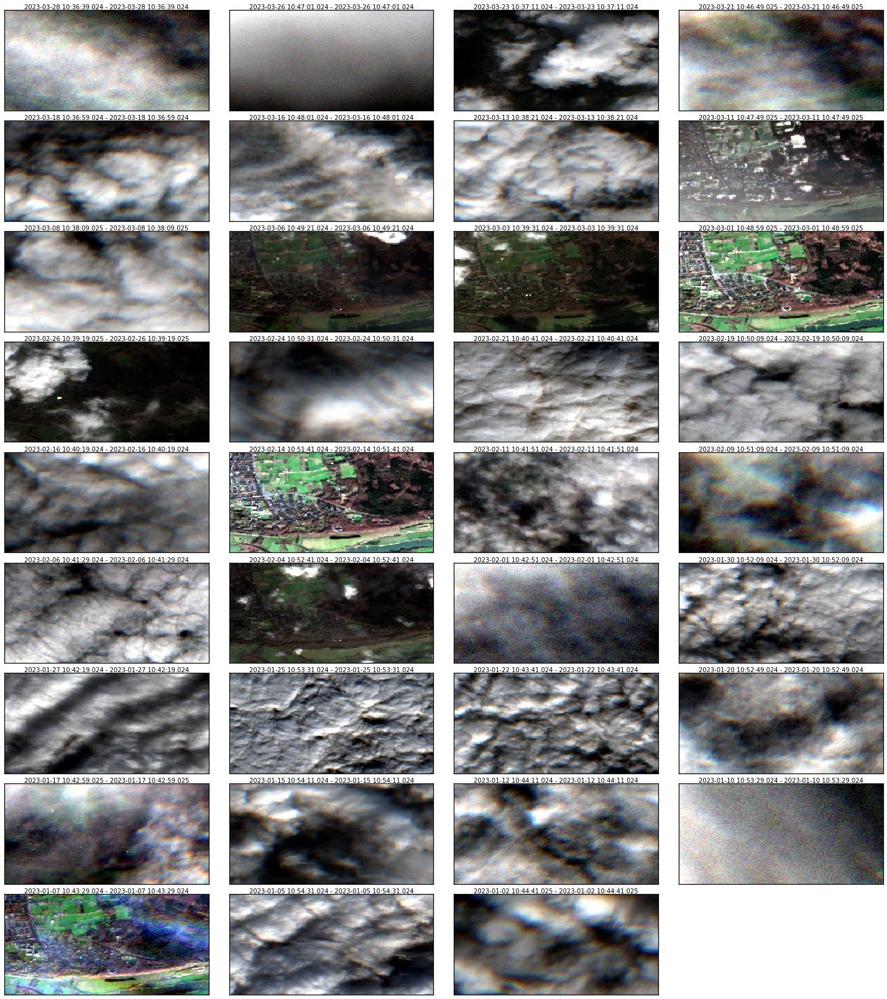

In [29]:
rdata.plot(groups=["B04", "B03", "B02"], img_title_text="date", layout_col=4)

Several pixels are completely covered by clouds. It's possible remove them using `process.Calc` and the [Scene Classification Layer (SCL)](https://sentinels.copernicus.eu/web/sentinel/technical-guides/sentinel-2-msi/level-2a/algorithm-overview), which has the follow flag values:

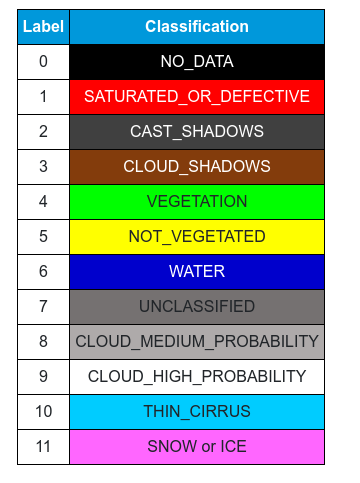

This class also support the calculation several spectral indices based on expressions (NDVI, EVI2, etc). As last step, let's run monthly aggregation by multiple time reducers.

In [30]:
from skmap.io import process

rdata = (
    rdata.run(
        process.Calc(  #
            expressions={"NDVI": "((B08 - B04) / (B08 + B04))*10000"},
            mask_group="SCL",
            mask_values=[0, 1, 2, 3, 8, 9],
        )
    )
    .drop(
        ["SCL"]  # Removing SCL group
    )
    .run(
        process.TimeAggregate(
            time=[process.TimeEnum.MONTHLY], operations=["p50", "p95"], verbose=True
        ),
        drop_input=True,
    )
)

[08:25:02] Running Calc on (147, 292, 175)
[08:25:03] Execution time for Calc: 0.71 segs
[08:25:03] Dropping data and info for groups: ['SCL']
[08:25:03] Running TimeAggregate on (147, 292, 35) for B02 group
[08:25:03] Computing 3 time aggregates from 2023 to 2023
[08:25:03] Dropping data and info for B02 group
[08:25:03] Execution time for TimeAggregate: 0.08 segs
[08:25:03] Running TimeAggregate on (147, 292, 35) for B03 group
[08:25:03] Computing 3 time aggregates from 2023 to 2023
[08:25:03] Dropping data and info for B03 group
[08:25:03] Execution time for TimeAggregate: 0.08 segs
[08:25:03] Running TimeAggregate on (147, 292, 35) for B04 group
[08:25:03] Computing 3 time aggregates from 2023 to 2023
[08:25:03] Dropping data and info for B04 group
[08:25:03] Execution time for TimeAggregate: 0.08 segs
[08:25:03] Running TimeAggregate on (147, 292, 35) for B08 group
[08:25:03] Computing 3 time aggregates from 2023 to 2023
[08:25:03] Dropping data and info for B08 group
[08:25:03] E

Here is the result:

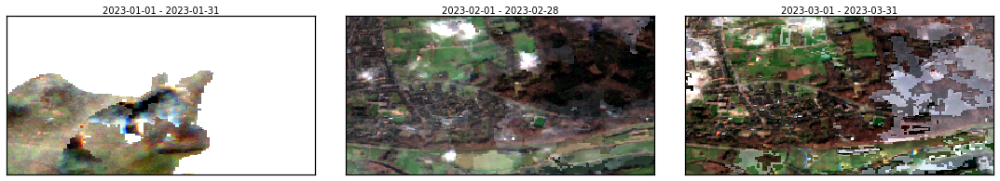

In [31]:
rdata.plot(
    groups=["B04.p50", "B03.p50", "B02.p50"], img_title_text="date", layout_col=4
)

Looks good, however there are gaps in January due the lack of clear sky images. To solve this issue, let's run the temporal gapfilling (`process.SeasConvFill`).

In [32]:
rdata = rdata.run(process.SeasConvFill(season_size=12, return_qa=True), drop_input=True)

[08:25:04] Running SeasConvFill on (147, 292, 3) for B02.p50 group
[08:25:04] Dropping data and info for B02.p50 group
[08:25:04] Execution time for SeasConvFill: 0.02 segs
[08:25:04] Running SeasConvFill on (147, 292, 3) for B02.p95 group
[08:25:04] Dropping data and info for B02.p95 group
[08:25:04] Execution time for SeasConvFill: 0.02 segs
[08:25:04] Running SeasConvFill on (147, 292, 3) for B03.p50 group
[08:25:04] Dropping data and info for B03.p50 group
[08:25:04] Execution time for SeasConvFill: 0.02 segs
[08:25:04] Running SeasConvFill on (147, 292, 3) for B03.p95 group
[08:25:04] Dropping data and info for B03.p95 group
[08:25:04] Execution time for SeasConvFill: 0.02 segs
[08:25:04] Running SeasConvFill on (147, 292, 3) for B04.p50 group
[08:25:04] Dropping data and info for B04.p50 group
[08:25:04] Execution time for SeasConvFill: 0.02 segs
[08:25:04] Running SeasConvFill on (147, 292, 3) for B04.p95 group
[08:25:04] Dropping data and info for B04.p95 group
[08:25:04] Execu

Here is the result:

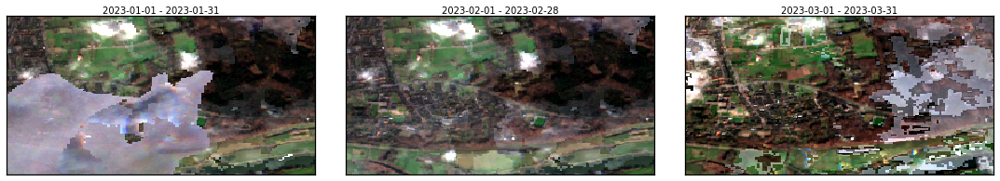

In [33]:
rdata.plot(
    groups=["B04.p50.seasconv", "B03.p50.seasconv", "B02.p50.seasconv"],
    img_title_text="date",
    layout_col=4,
)

We are ready to export our data cube to folder

In [34]:
rdata.to_dir("./skmap-s2-data-cube")

[08:25:05] Saving rasters in skmap-s2-data-cube
[08:25:05] Transform (5.67667, 51.9616, 5.710831, 51.978785) into Window(col_off=10618.03314566466, row_off=3103.2150360064115, width=292, height=147)
[08:25:05] Saving 60 raster files using 4 workers
